# Creative sound mosaicing with Freesound and Essentia

The idea of this concept is to basically download sound from Freesound, use Essentia to extract meaningful information from the input sound source and all the sounds retrieved from Freesound, and make a sound mosaic with the downloaded sounds tryng to reconstruct the original input sound.

# 1) Create source sound collection

In [1]:
import os
import math
import datetime
import pandas as pd
import numpy as np
import freesound
import essentia as ess
import essentia.standard as estd
import matplotlib.pyplot as plt
from IPython.display import display, Audio
from sklearn.neighbors import NearestNeighbors

# Defining all the constants that will be used within the code

DOWNLOAD_SOUNDS = True
ANALYSE_SOUNDS = True
PRINT_PROCESS = True
PLOT_RESULTS = True
FREESOUND_API_KEY = 'LBiIBlBcHYcjpnkcm1091c2pgkGOozMZXWsllfbb'  # Please replace by your own Freesound API key

FREESOUND_QUERY_1 = 'string' # 1st freesound query
FREESOUND_QUERY_2 = 'chicken' # 2nd freesound query
FREESOUND_QUERY_3 = 'lion' # 3rd freesound query

N_NEIGHBOURS_TO_FIND = 15 # Number of neighbours to find
SIMILARITY_FEATURES = ['centroid', 'mfcc_0', 'mfcc_1', 'mfcc_2', 'mfcc_3', 'mfcc_4', 'mfcc_5', 'mfcc_6', 'mfcc_7', 'mfcc_8', 'mfcc_9', 'mfcc_10', 'mfcc_11', 'mfcc_12']  # Use MFCCs for sound similarity ['mfcc_0', 'mfcc_1']

ANALYZE_SOUND_FRAME_SIZE = 1024 # Surce sound analysis frame sizes (Original Value: 8820)
HOP_SIZE = 512 # Parameter used by the "FrameGenerator" and "FFT" functions
MINIMUM_FRAME_SIZE = 1024 # Minimum frame size needed for the triangular bands on the MFCC's

INPUT_DIR = 'Input'  # Input folder name
OUTPUT_DIR = 'Output'  # Output folder name
FILES_DIR = 'Files'  # Generated files' folder name
SOUNDS_DIR = 'Sounds'  # Generated Sounds' folder name
FILES_DIR_PATH = OUTPUT_DIR + "/" + FILES_DIR # Place where to store the generated files. Will be relative to the current folder.
INPUT_SOUNDS_DIR_PATH = INPUT_DIR + "/" + SOUNDS_DIR # Place where to store the downloaded sounds. Will be relative to the current folder.
OUTPUT_SOUNDS_DIR_PATH = OUTPUT_DIR + "/" + SOUNDS_DIR # Place where to store the generated sounds. Will be relative to the current folder.

DATAFRAME_FILENAME = 'dataframe.csv'  # File where we'll store the metadata of our sounds collection
DATAFRAME_SOURCE_FILENAME = 'dataframe_source.csv'  # DataFrame file where to store the results of our analysis
FREESOUND_STORE_METADATA_FIELDS = ['id', 'name', 'username', 'previews', 'license', 'tags']  # Freesound metadata properties to store

TARGET_SOUND_PATH = INPUT_DIR + "/" + '262350__stereo-surgeon__grinder-drum-loop.wav'  # Filename of the target audio we'll reconstruct
DATAFRAME_TARGET_FILE_FILENAME = 'dataframe_target.csv'  # DataFrame file where to store the analysis results of the target audio

freesound_client = freesound.FreesoundClient()
freesound_client.set_token(FREESOUND_API_KEY)

# Generating folders structure
if not os.path.exists(INPUT_DIR): os.mkdir(INPUT_DIR)
if not os.path.exists(OUTPUT_DIR): os.mkdir(OUTPUT_DIR)
if not os.path.exists(FILES_DIR_PATH): os.mkdir(FILES_DIR_PATH)
if not os.path.exists(INPUT_SOUNDS_DIR_PATH): os.mkdir(INPUT_SOUNDS_DIR_PATH)
if not os.path.exists(OUTPUT_SOUNDS_DIR_PATH): os.mkdir(OUTPUT_SOUNDS_DIR_PATH)

In [2]:
# Define some util functions

def query_freesound(query, filter, num_results=10):
    """Queries freesound with the given query and filter values.
    If no filter is given, a default filter is added to only get sounds shorter than 30 seconds.
    """
    if filter is None:
        filter = 'duration:[0 TO 30]'  # Set default filter
    pager = freesound_client.text_search(
        query = query,
        filter = filter,
        fields = ','.join(FREESOUND_STORE_METADATA_FIELDS),
        group_by_pack = 1,
        page_size = num_results
    )
    return [sound for sound in pager]

def retrieve_sound_preview(sound, directory):
    """Download the high-quality OGG sound preview of a given Freesound sound object to the given directory.
    """
    return freesound.FSRequest.retrieve(
        sound.previews.preview_hq_ogg,
        freesound_client,
        os.path.join(directory, sound.previews.preview_hq_ogg.split('/')[-1])
    )

def make_pandas_record(sound):
    """Create a dictionary with the metadata that we want to store for each sound.
    """
    record = {key: sound.as_dict()[key] for key in FREESOUND_STORE_METADATA_FIELDS}
    del record['previews']  # Don't store previews dict in record
    record['freesound_id'] = record['id']  # Rename 'id' to 'freesound_id'
    del record['id']
    record['path'] = INPUT_SOUNDS_DIR_PATH + "/" + sound.previews.preview_hq_ogg.split("/")[-1]  # Store path of downloaded file
    return record

def zero_padding(input_arr, length):
    if (len(input_arr) > length):
        length = next_power_of_2(length)
    arr = np.zeros(length)
    arr[:len(input_arr)] = input_arr
    return arr

def next_power_of_2(x):
    return 1 if x == 0 else 2**math.ceil(math.log2(x))

In [3]:
# Checking if we must re-download the sounds
if (DOWNLOAD_SOUNDS):
    
    # Build our collection of sounds

    # Our collection of sounds is made by appending the results of a number of different queries to freesound
    # The query terms, query filters and the number of results per query are all defined here.
    # Information about how to define filters can be found in the Freesound API documentation: https://freesound.org/docs/api/resources_apiv2.html#request-parameters-text-search-parameters
    freesound_queries = [
        {
            'query': FREESOUND_QUERY_1,
            'filter': None,
            'num_results': 20, 
        },
        {
            'query': FREESOUND_QUERY_2,
            'filter': None,
            'num_results': 20, 
        },
        {
            'query': FREESOUND_QUERY_3,
            'filter': None,
            'num_results': 20, 
        },
    ]

    # Do all queries and concatenate the results in a single list of sounds
    sounds = sum([query_freesound(query['query'], query['filter'], query['num_results']) for query in freesound_queries],[])

    # Download the sounds and save them to FILES_DIR_PATH folder
    for count, sound in enumerate(sounds):
        print('Downloading sound with id {0} [{1}/{2}]'.format(sound.id, count + 1, len(sounds)))
        retrieve_sound_preview(sound, INPUT_SOUNDS_DIR_PATH)

    # Make a Pandas DataFrame with the metadata of our sound collection and save it
    df =  pd.DataFrame([make_pandas_record(s) for s in sounds])
    df.to_csv(FILES_DIR_PATH + "/" + DATAFRAME_FILENAME)
    if(PRINT_PROCESS): print('Saved DataFrame with {0} entries! {1}'.format(len(df), FILES_DIR_PATH + "/" + DATAFRAME_FILENAME))

    # Show the contents of our DataFrame (the metadata of our source collection)
    if(PRINT_PROCESS): display(df)

Saved DataFrame with 60 entries! Output/Files/dataframe.csv


,freesound_id,license,name,path,tags,username
0,397443,http://creativecommons.org/licenses/by/3.0/,"Piano, Metal Mallet, Scrape, Full String, Mid,...",Input/Sounds/397443_5121236-hq.ogg,"[string, piano, Scraped, Piano, scrape, Scrape...",InspectorJ
1,411726,http://creativecommons.org/licenses/by/3.0/,"Violin, Glissando, Ascending, A (H6 XY).wav",Input/Sounds/411726_5121236-hq.ogg,"[string, ascending, Violin, glissando, rising,...",InspectorJ
2,414438,http://creativecommons.org/licenses/by/3.0/,"Light, Pulley Switch, On, C.wav",Input/Sounds/414438_5121236-hq.ogg,"[String, light, On, Switch, switch, Light, Pul...",InspectorJ
3,121328,http://creativecommons.org/publicdomain/zero/1.0/,evil string.wav,Input/Sounds/121328_1935622-hq.ogg,"[ambient, soundscape, string]",stk13
4,117673,http://creativecommons.org/licenses/by/3.0/,A open string.wav,Input/Sounds/117673_646701-hq.ogg,"[a, classical, guitar, note, nylon, open, span...",Kyster
5,30146,http://creativecommons.org/licenses/by/3.0/,bowed high strings.wav,Input/Sounds/30146_24119-hq.ogg,"[bowed, electric, experimental, guitar, note, ...",johnnypanic
6,190014,http://creativecommons.org/licenses/by/3.0/,desolated_strings_&_wood_loose_string_drop_rat...,Input/Sounds/190014_2058748-hq.ogg,"[String, wooden-instrument, rattle, old-zither...",TheSoundcatcher
7,91203,http://creativecommons.org/licenses/by-nc/3.0/,remix of 30192__ERH__string_1_loop_[wider].wav,Input/Sounds/91203_1015240-hq.ogg,"[electronic, loop, string, synth, weird, 30192...",Timbre
8,4252,http://creativecommons.org/licenses/by/3.0/,toy.harp_detuned_picked.mp3,Input/Sounds/4252_8043-hq.ogg,"[arpeggio, harp, musical-instruments, string]",dobroide
9,332599,http://creativecommons.org/publicdomain/zero/1.0/,E5.wav,Input/Sounds/332599_5833352-hq.ogg,"[note, violin, string]",jeudyx


# 2) Analyze source collection and target file

In [4]:
# Define here our sound analysis function
# NOTE: remember that if you update this function and want to run a new analysis you'll need to re-run both 
# this cell and the cells below that carry out the audio analysis and that call the analysis function. 
# After analyzing the source collection or the target file, make sure to correct descriptors have been 
# extracted by checking the DataFrame contents. DataFrame contents can be printed on screen as a table 
# using 'display(data_frame_object)'

def analyze_sound(audio_path, audio_id=None):
    """Analyze the audio file given in 'sound_path'.
    Use the parameter 'frame_size' to set the size of the chunks in which the audio will 
    be split for analysis. If no frame_size is given, the whole audio will be analyzed as 
    a single frame.
    Use the 'audio_id' parameter to pass a custom identifier for the audio that will be 
    included in the analysis results. This can be useful to later identify to which file an analysis belongs.
    """
    analysis_output = []  # Here we'll store the analysis results for each chunk (frame) of the audio file
    
    # Load audio file
    audio = estd.MonoLoader(filename=audio_path)()
    
    # This pool will be used to store the onset detection values
    pool = ess.Pool()
    
    # Functions needed on the onset step
    hnw = estd.Windowing(type = 'hann')
    fft = estd.FFT()
    c2p = estd.CartesianToPolar()
    odc = estd.OnsetDetection(method='complex')
    onsets = estd.Onsets()
    
    # First let's analyse all the frames to find the onsets
    for frame in estd.FrameGenerator(audio, frameSize = ANALYZE_SOUND_FRAME_SIZE, hopSize = HOP_SIZE):
        mag, phase = c2p(fft(hnw(frame)))
        pool.add('features.complex', odc(mag, phase) )
    
    # Obtaining the onsets
    complex_onsets = onsets(ess.array([ pool['features.complex'] ]), [ 1 ])
    
    # Calculate the start and end samples for each equally-spaced audio frame
    frame_start_samples = []

    for complex_onset in complex_onsets:
        frame_start_samples.append( int( round(complex_onset * 44100) ) )
    
    frame_start_samples.insert(0,0) # Prepending sample 0 for the first frame
    frame_start_samples.append( len(audio) ) # Appending sample "len(audio)" for the last frame

    # To numpy array
    frame_start_samples = np.array(frame_start_samples)
    
    # Calculate the start and end samples for each audio frame
    frame_start_end_samples = zip(frame_start_samples[:-1], frame_start_samples[1:])

    # Iterate over audio frames and analyze each one
    for count, (fstart, fend) in enumerate(frame_start_end_samples):

        # Get corresponding audio chunk and initialize dictionary to sotre analysis results with some basic metadata
        frame = audio[fstart:fend]
        
        if ( len(frame) < MINIMUM_FRAME_SIZE ):
            zero_padded_frame = ess.array(zero_padding(frame, MINIMUM_FRAME_SIZE))
        else:
            zero_padded_frame = ess.array(zero_padding(frame, next_power_of_2(len(frame))))
            
        frame_output = {
            'freesound_id': audio_id,
            'id': '{0}_f{1}'.format(audio_id, count),
            'path': audio_path,
            'file_name': os.path.basename(audio_path),
            'start_sample': fstart,
            'end_sample': fend,
        }
        
        # Extract loudness
        loudness_algo = estd.Loudness()
        loudness = loudness_algo(zero_padded_frame)
        frame_output['loudness'] = loudness / len(zero_padded_frame)  # Normnalize by length of frame

        # Extract MFCC coefficients
        w_algo = estd.Windowing(type = 'hann')
        spectrum_algo = estd.Spectrum()
        mfcc_algo = estd.MFCC()
        spec = spectrum_algo(w_algo(zero_padded_frame))
        _, mfcc_coeffs = mfcc_algo(spec)
        frame_output.update({'mfcc_{0}'.format(j): mfcc_coeffs[j] for j in range(0, len(mfcc_coeffs))})
        
        # Extract other features here and add to 'frame_output' dictionary
        
        # Extract centroid
        frame_output['centroid'] = estd.Centroid()(spec)
        
        # Add frame analysis results to output
        analysis_output.append(frame_output)

    return analysis_output

## Analyze source collection

In [5]:
# Checking if we must re-analyse the sounds
if (ANALYSE_SOUNDS | DOWNLOAD_SOUNDS):
    
    # Load the DataFrame of the sound source collection created in previous notebook and analyze all sound files in it
    df = pd.read_csv(open(FILES_DIR_PATH + "/" + DATAFRAME_FILENAME), index_col=0)
    analyses = []
    for i in range(0, len(df)):
        sound = df.iloc[i]  # Get DataFrame sound at position 'i'
        print('Analyzing sound with id {0} [{1}/{2}]'.format(sound['freesound_id'], i + 1, len(df)))
        analysis_output = analyze_sound(sound['path'], audio_id=sound['freesound_id'])  # Split audio in chunks of 200ms (44100/5 samples)
        analyses += analysis_output

    # Store analysis results in a new Pandas DataFrame and save it
    df_source = pd.DataFrame(analyses)
    df_source.to_csv(FILES_DIR_PATH + "/" + DATAFRAME_SOURCE_FILENAME)
    print('Saved source DataFrame with {0} entries! {1}'.format(len(df_source), FILES_DIR_PATH + "/" + DATAFRAME_SOURCE_FILENAME))

    if(PRINT_PROCESS): display(df_source)  # Show DataFrane contents
    if(PRINT_PROCESS): df_source.describe()  # Show some statistics of numerical fields in the DataFrame

Analyzing sound with id 397443 [1/60]
Analyzing sound with id 411726 [2/60]
Analyzing sound with id 414438 [3/60]
Analyzing sound with id 121328 [4/60]
Analyzing sound with id 117673 [5/60]
Analyzing sound with id 30146 [6/60]
Analyzing sound with id 190014 [7/60]
Analyzing sound with id 91203 [8/60]
Analyzing sound with id 4252 [9/60]
Analyzing sound with id 332599 [10/60]
Analyzing sound with id 106808 [11/60]
Analyzing sound with id 121023 [12/60]
Analyzing sound with id 121031 [13/60]
Analyzing sound with id 121059 [14/60]
Analyzing sound with id 121061 [15/60]
Analyzing sound with id 121080 [16/60]
Analyzing sound with id 121081 [17/60]
Analyzing sound with id 121093 [18/60]
Analyzing sound with id 337981 [19/60]
Analyzing sound with id 253189 [20/60]
Analyzing sound with id 316920 [21/60]
Analyzing sound with id 316921 [22/60]
Analyzing sound with id 233093 [23/60]
Analyzing sound with id 435882 [24/60]
Analyzing sound with id 456803 [25/60]
Analyzing sound with id 166487 [26/60]

,centroid,end_sample,file_name,freesound_id,id,loudness,mfcc_0,mfcc_1,mfcc_10,mfcc_11,...,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,mfcc_9,path,start_sample
0,0.062859,2048,397443_5121236-hq.ogg,397443,397443_f0,0.000553,-908.995728,175.565948,1.536499,9.570576,...,9.599037,15.456070,21.330158,1.365562,14.191822,2.797680,-2.502293,4.985672,Input/Sounds/397443_5121236-hq.ogg,0
1,0.300412,36928,397443_5121236-hq.ogg,397443,397443_f1,0.000307,-1028.641846,-8.689552,5.944389,10.756514,...,-35.696209,9.643772,18.054710,17.823601,17.962688,5.910444,14.607956,21.368088,Input/Sounds/397443_5121236-hq.ogg,2048
2,0.165157,8704,411726_5121236-hq.ogg,411726,411726_f0,0.000006,-1087.946533,44.656902,20.152935,18.822947,...,11.862152,-7.347668,-21.110210,-7.715904,6.008656,9.637087,11.947750,11.248652,Input/Sounds/411726_5121236-hq.ogg,0
3,0.183814,20480,411726_5121236-hq.ogg,411726,411726_f1,0.000608,-839.140747,-12.292191,17.031559,24.084682,...,-94.443848,24.110119,-32.435898,12.791718,-26.807892,18.750929,4.878475,28.500410,Input/Sounds/411726_5121236-hq.ogg,8704
4,0.213642,23040,411726_5121236-hq.ogg,411726,411726_f2,0.000895,-740.211731,-24.600964,2.703478,-12.569204,...,-63.097313,11.407633,-65.076157,11.559292,-6.944006,23.598490,20.648758,17.292589,Input/Sounds/411726_5121236-hq.ogg,20480
5,0.136556,37888,411726_5121236-hq.ogg,411726,411726_f3,0.005238,-728.810608,-22.100243,-48.080753,-12.156691,...,-134.842239,-27.486252,-35.267166,11.072954,25.278931,47.773079,3.737793,-2.528187,Input/Sounds/411726_5121236-hq.ogg,23040
6,0.208818,46592,411726_5121236-hq.ogg,411726,411726_f4,0.002678,-819.351807,-69.960449,30.326128,-26.936102,...,-74.696671,9.956619,-5.225624,31.924297,15.343836,-35.422508,-28.192732,56.441441,Input/Sounds/411726_5121236-hq.ogg,37888
7,0.320178,94016,411726_5121236-hq.ogg,411726,411726_f5,0.000188,-1133.239990,7.310863,5.963779,5.706581,...,7.266541,7.193409,7.091736,6.963020,6.808216,6.629044,6.427235,6.204775,Input/Sounds/411726_5121236-hq.ogg,46592
8,0.221349,1536,414438_5121236-hq.ogg,414438,414438_f0,0.000070,-831.409607,20.625187,5.116657,-0.793432,...,-10.121117,39.193291,-1.861444,-9.367741,-10.114590,-1.020397,-4.681665,25.399973,Input/Sounds/414438_5121236-hq.ogg,0
9,0.258002,11776,414438_5121236-hq.ogg,414438,414438_f1,0.000336,-987.211304,38.298016,2.434170,-11.353165,...,3.350773,39.773830,13.699139,12.533684,12.313950,13.323465,6.305462,30.979187,Input/Sounds/414438_5121236-hq.ogg,1536


## Analyze the target sound file

Analyzing target sound Input/262350__stereo-surgeon__grinder-drum-loop.wav
Saved target dataframe with 165 entries! Input/Sounds/dataframe_target.csv


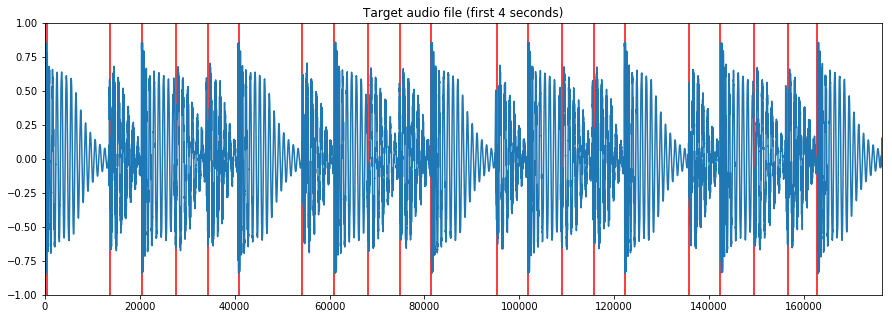

,centroid,end_sample,file_name,freesound_id,id,loudness,mfcc_0,mfcc_1,mfcc_10,mfcc_11,...,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,mfcc_9,path,start_sample
0,0.133903,512,262350__stereo-surgeon__grinder-drum-loop.wav,None,None_f0,0.043696,-462.988892,151.848801,-6.274487,-6.741371,...,35.132252,28.709660,12.384865,9.945879,2.970699,2.326290,-1.658842,-3.532673,Input/262350__stereo-surgeon__grinder-drum-loo...,0
1,0.045081,13824,262350__stereo-surgeon__grinder-drum-loop.wav,None,None_f1,0.008082,-923.767090,183.359711,21.575123,5.503807,...,44.634830,26.432987,16.550705,11.358887,18.392582,20.120089,11.700024,13.936689,Input/262350__stereo-surgeon__grinder-drum-loo...,512
2,0.109423,20480,262350__stereo-surgeon__grinder-drum-loop.wav,None,None_f2,0.008917,-682.526611,161.802856,8.372784,11.537355,...,-3.415318,2.558636,3.982979,21.158159,-1.324894,7.155771,19.634624,-2.195765,Input/262350__stereo-surgeon__grinder-drum-loo...,13824
3,0.033611,27648,262350__stereo-surgeon__grinder-drum-loop.wav,None,None_f3,0.016836,-856.292542,209.830307,9.515366,12.890434,...,45.632435,21.010960,22.240204,21.243980,10.624493,14.788723,14.721405,17.765816,Input/262350__stereo-surgeon__grinder-drum-loo...,20480
4,0.060123,34304,262350__stereo-surgeon__grinder-drum-loop.wav,None,None_f4,0.009521,-748.120728,185.774933,10.648285,5.969841,...,6.673866,-11.002491,11.442776,28.493448,3.060654,12.483704,4.201298,22.005033,Input/262350__stereo-surgeon__grinder-drum-loo...,27648
5,0.111229,40960,262350__stereo-surgeon__grinder-drum-loop.wav,None,None_f5,0.009264,-673.760742,158.922119,4.753702,8.884037,...,4.081791,15.485275,8.179585,19.097395,-4.057463,1.421450,13.079395,-4.949259,Input/262350__stereo-surgeon__grinder-drum-loo...,34304
6,0.017481,54272,262350__stereo-surgeon__grinder-drum-loop.wav,None,None_f6,0.008497,-997.572571,157.746216,16.440899,13.841850,...,77.377869,27.714756,20.839493,25.805008,23.619648,16.725458,12.499210,14.106493,Input/262350__stereo-surgeon__grinder-drum-loo...,40960
7,0.046641,60928,262350__stereo-surgeon__grinder-drum-loop.wav,None,None_f7,0.008359,-783.741943,242.516357,17.811359,11.314301,...,-27.844799,-12.944790,12.448288,12.572189,2.222370,6.569130,14.710033,12.834757,Input/262350__stereo-surgeon__grinder-drum-loo...,54272
8,0.028355,68096,262350__stereo-surgeon__grinder-drum-loop.wav,None,None_f8,0.016974,-855.780090,216.242493,17.213375,21.324181,...,48.538380,22.857227,22.612885,14.819927,12.347916,24.034016,9.599915,10.560808,Input/262350__stereo-surgeon__grinder-drum-loo...,60928
9,0.070375,74752,262350__stereo-surgeon__grinder-drum-loop.wav,None,None_f9,0.009539,-772.311462,203.492813,10.384537,14.577805,...,-3.852436,-12.697861,11.317844,20.398067,8.480434,11.785536,12.105804,8.249588,Input/262350__stereo-surgeon__grinder-drum-loo...,68096


In [6]:
# Analyze the target audio file and store results in a new DataFrame
print('Analyzing target sound {0}'.format(TARGET_SOUND_PATH))
target_analysis = analyze_sound(TARGET_SOUND_PATH)  # Also split audio in chunks of 200ms (44100/5 samples) 
df_target = pd.DataFrame(target_analysis)
df_target.to_csv(INPUT_SOUNDS_DIR_PATH + "/" + DATAFRAME_TARGET_FILE_FILENAME)
print('Saved target dataframe with {0} entries! {1}'.format(len(df_target), INPUT_SOUNDS_DIR_PATH + "/" + DATAFRAME_TARGET_FILE_FILENAME))

# Plot target audio file waveform and show ticks at the start samples of the chunks
plt.figure(figsize=(15,5))
audio = estd.MonoLoader(filename=TARGET_SOUND_PATH)()
plt.plot(audio)
plt.vlines(df_target['start_sample'].values, -1, 1, color='red')
# plt.vlines(df_target['onsets_complex'].values, -1, 1, color='red')
plt.axis([0, min(len(audio), 44100 * 4), -1, 1])
plt.title('Target audio file (first 4 seconds)')
plt.show()

display(df_target)  # Show data frame contents
if(PRINT_PROCESS): df_target.describe()  # Show statistics of numerical fields in data frame

# 3) Reconstruct target file with source collection frames

This section contains the code that performs *audio mosaicing* to construct a new version of the target file by using audio frames chosen from the source collection. This notebook used the DataFrames generated in the previous steps which contain metadata about the Freesound sounds in the source collection, the analysis results of the source collection and the analysis results of the target audio file.

In [7]:
# Define some util functions
# NOTE: remember that if you update these util functions and want to do a new audio mosaicing, you'll need 
# to re-run both this cell (to update the util functions) and the cell below (which uses the util functions to
# do the audio mosaicing).

loaded_audio_files = {}

def get_audio_file_segment(file_path, start_sample, n_samples):
    """Load audio file. Try to get it from memory first. If not there, open it and save in memory for next time.
    """
    if file_path not in loaded_audio_files:
        loader = estd.MonoLoader(filename=file_path)
        audio = loader()
        loaded_audio_files[file_path] = audio
    else:
        audio = loaded_audio_files[file_path]
        
    # Return segment
    return audio[start_sample:start_sample + n_samples]

def find_similar_frames(query_frame, df_source_frames, n, features):
    """Find the 'n' mosr similar frames for a given 'query_frame' from those in the given 'df_source_frames'.
    Similarity is computed using a nearest neighbours algorithm and taking only into account the feature list
    given in the 'features' parameter.
    """
    query_frame = query_frame.reshape(1,-1)
    nbrs = NearestNeighbors(n_neighbors=n, algorithm='ball_tree').fit(df_source_frames[features].values)
    distances, indices = nbrs.kneighbors(query_frame)
    return [df_source_frames.iloc[k] for k in indices[0]]

def chose_frame_from_source_collection(target_frame, df_source_frames):
    """Choose one frame from 'df_source_frames' to replace the 'target_frame'.
    This implementation chooses the source frame usinng a similarity algorithm 'find_similar_frames',
    and a specific set of similarity features for timbre (MFCC).
    You can modify this function to implement new ways to choose a frame from the source.
    
    NOTE: 'target_frame' here should have the same features as 'df_source_frames' because both the
    target file and the source collection have been analyzed with the same analysis function.
    You can list available features using 'print(list(target_frame.keys()))' and print(list(df_source_frames.keys()))
    """
    n_neighbours_to_find = N_NEIGHBOURS_TO_FIND
    similarity_features = SIMILARITY_FEATURES # Use MFCCs for sound similarity ['mfcc_0', 'mfcc_1']

    # Find the 10 most similar frames to the target_frame from df_source_framesdf_source_units 
    query_frame = target_frame[similarity_features].values
    similar_frames = find_similar_frames(query_frame, df_source_frames, n_neighbours_to_find, similarity_features)
    
    # Choose the first one as is the most similar
    most_similar_frame = similar_frames[0]
    
    return most_similar_frame
    

In [8]:
# Do the reconstruction (audio mosaicing) of the target file using audio chunks (units, frames) from the sounds in the source collection

# Load target audio file to get its total length and to use it later
target_sound_filename = df_target.iloc[0]['file_name']
target_audio = estd.MonoLoader(filename=df_target.iloc[0]['path'])()
total_length_target_audio = len(target_audio)

# Init array where to put the audio of the reconstructed file
generated_audio = np.zeros(total_length_target_audio)

# Init list where to store IDs of sounds used in the reconstruction
selected_freesound_ids = []

# Iterate over the analyzed frame of the target file
print('Reconstructing audio file...')
for i in range(0, len(df_target)):
    target_frame = df_target.iloc[i]  # Get current frame
    
    # Choose one frame from the source collection to replace the target frame
    most_similar_frame = chose_frame_from_source_collection(target_frame, df_source)
    
    # Store freesound ID of the original sound where the 'most_similar_frame' belongs to
    selected_freesound_ids.append(most_similar_frame['freesound_id'])
    
    # Get the audio segment corresponding to the 'most_similar_frame'
    target_frame_n_samples = target_frame['end_sample'] - target_frame['start_sample']
    most_similar_frame_audio = get_audio_file_segment(most_similar_frame['path'], most_similar_frame['start_sample'], target_frame_n_samples)
    
    # Add audio segment to the reconstructed audio array
    generated_audio[target_frame['start_sample']:target_frame['start_sample']+len(most_similar_frame_audio)] = most_similar_frame_audio

# Store the results in a WAV file
generated_audio_filename = '{0}.reconstructed '.format(target_sound_filename) + str(datetime.datetime.now().strftime("%Y-%m-%d_%H%M%S")) + '.wav'
estd.MonoWriter(filename=OUTPUT_SOUNDS_DIR_PATH + "/" + generated_audio_filename, format='wav', sampleRate=44100)(ess.array(generated_audio))
print('Audio generated and saved in {0}!\nIt contains audio from the following sounds:'.format(generated_audio_filename))
if(PRINT_PROCESS): display(df.loc[df['freesound_id'].isin(selected_freesound_ids)])  # Show metadata for the Freesound sounds used in the reconstruction

Reconstructing audio file...
Audio generated and saved in 262350__stereo-surgeon__grinder-drum-loop.wav.reconstructed 2019-02-27_214509.wav!
It contains audio from the following sounds:


,freesound_id,license,name,path,tags,username
7,91203,http://creativecommons.org/licenses/by-nc/3.0/,remix of 30192__ERH__string_1_loop_[wider].wav,Input/Sounds/91203_1015240-hq.ogg,"['electronic', 'loop', 'string', 'synth', 'wei...",Timbre
14,121061,http://creativecommons.org/licenses/by/3.0/,160 link strings 2.wav,Input/Sounds/121061_2193266-hq.ogg,"['classical', 'loop', 'loops', 'orchestra', 's...",Thirsk
19,253189,http://creativecommons.org/licenses/by-nc/3.0/,E minor 2nd frett 4th string down,Input/Sounds/253189_4663216-hq.ogg,"['chord', 'string', 'strummed', 'guitar', 'aco...",GW7fold
23,435882,http://creativecommons.org/licenses/by/3.0/,Chicken,Input/Sounds/435882_1992856-hq.ogg,"['hen', 'chicken', 'animal', 'clucking', 'chic...",dersuperanton
24,456803,http://creativecommons.org/publicdomain/zero/1.0/,Chicken clucking,Input/Sounds/456803_9159316-hq.ogg,"['hen', 'chicken', 'clucking', 'rooster', 'cro...",Breviceps
26,118960,http://creativecommons.org/publicdomain/zero/1.0/,Chickens.wav,Input/Sounds/118960_1990695-hq.ogg,"['animal', 'chicken', 'chickens', 'clucking']",esperri
29,448118,http://creativecommons.org/publicdomain/zero/1.0/,Chicken sounds 1,Input/Sounds/448118_6405049-hq.ogg,"['birds', 'clucking', 'Chicken']",indirect
31,455905,http://creativecommons.org/publicdomain/zero/1.0/,chicken.wav,Input/Sounds/455905_2468652-hq.ogg,"['hen', 'clucking', 'chicken']",JhennaSide
35,424076,http://creativecommons.org/publicdomain/zero/1.0/,chicken sound - clucking.wav,Input/Sounds/424076_7388661-hq.ogg,"['hen', 'hens', 'morning', 'chicken', 'cock', ...",chanyatenn
46,97380,http://creativecommons.org/licenses/by/3.0/,african_lion.wav,Input/Sounds/97380_1578278-hq.ogg,"['africa', 'field-recording', 'lion', 'roaring...",soundbytez


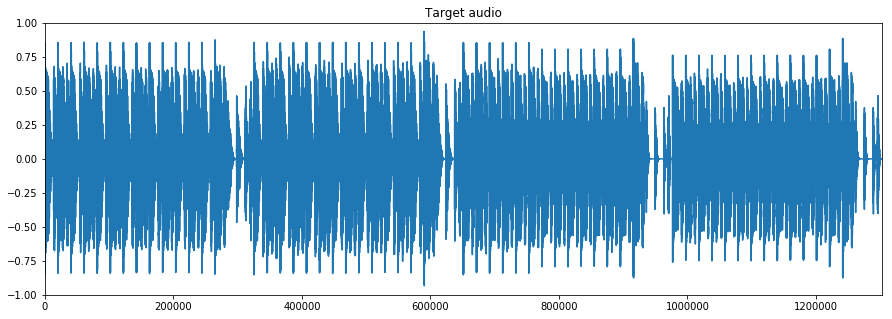

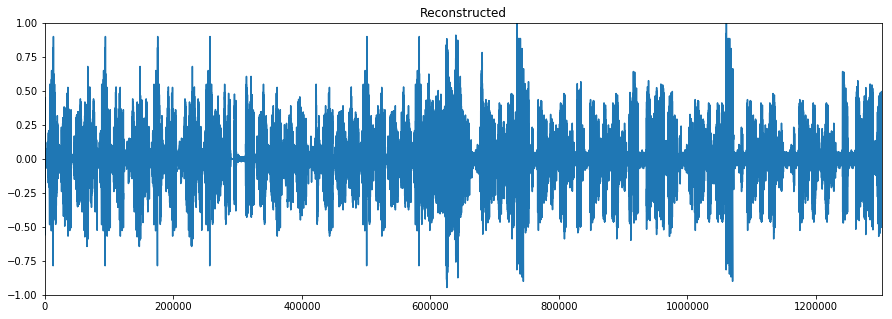

Target audio


Reconstructed


Mix of both signals


In [9]:
# Checking if we must plot the results
if (PLOT_RESULTS):

    # Show further results of the reconstruction

    # Plot waveforms
    plt.figure(figsize=(15,5))
    plt.plot(target_audio)
    plt.axis([0, len(target_audio), -1, 1])
    plt.title('Target audio')
    plt.show()

    plt.figure(figsize=(15,5))
    plt.plot(generated_audio)
    plt.axis([0, len(target_audio), -1, 1])
    plt.title('Reconstructed')
    plt.show()

    # Show audio players
    print('Target audio')
    display(Audio(target_audio, rate=44100))

    print('Reconstructed')
    display(Audio(generated_audio, rate=44100))

    print('Mix of both signals')
    display(Audio(generated_audio * 0.5 + target_audio * 0.5, rate=44100))